In [1]:
pip install yfinance

     |████████████████████████████████| 59 kB 2.1 MB/s eta 0:00:011
     |████████████████████████████████| 502 kB 3.2 MB/s eta 0:00:01
     |████████████████████████████████| 132 kB 339 kB/s eta 0:00:01
     |████████████████████████████████| 4.7 MB 301 kB/s eta 0:00:01
     |████████████████████████████████| 11.9 MB 248 kB/s eta 0:00:01
  Attempting uninstall: pytz
    Found existing installation: pytz 2021.1
    Uninstalling pytz-2021.1:
      Successfully uninstalled pytz-2021.1
  Attempting uninstall: pandas
    Found existing installation: pandas 1.2.4
    Uninstalling pandas-1.2.4:
      Successfully uninstalled pandas-1.2.4
  Attempting uninstall: lxml
    Found existing installation: lxml 4.6.3
    Uninstalling lxml-4.6.3:
      Successfully uninstalled lxml-4.6.3
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.9.3
    Uninstalling beautifulsoup4-4.9.3:
      Successfully uninstalled beautifulsoup4-4.9.3
ERROR: pip's dependency resolver

In [164]:
pip install ratelimit

  Created wheel for ratelimit: filename=ratelimit-2.2.1-py3-none-any.whl size=5891 sha256=dda95493b20d1f70a7f51653805a10d70fc86af3cf70baf4ccb5663c777a883c
  Stored in directory: /Users/derek/Library/Caches/pip/wheels/8e/34/5e/1dd3d652594bdf5df01109a683a455121d0b726978051bf720
Successfully built ratelimit
Note: you may need to restart the kernel to use updated packages.


In [14]:
# %load_ext autoreload
# %autoreload 2
# import os
# import sys
# module_path = os.path.abspath(os.path.join('/')) # or the path to your source code
# sys.path.insert(0, module_path)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [27]:
%run ~/Documents/Misc/myally/config.py as cfg

# IMPORT 

In [50]:
import requests
import json
import pandas as pd
from ratelimit import limits, sleep_and_retry
import datetime
import numpy as np
from requests_oauthlib import OAuth1Session

import config as cfg

import plotly.express as px
from statsmodels.tsa.api import ExponentialSmoothing

import plotly.graph_objects as go

In [36]:
pd.options.display.max_rows = None
pd.options.display.max_columns = None
pd.options.display.max_colwidth = None


# Ideas for settings

In [37]:
#strategy values:
mover_opts = ['ally','alphavantage','fmp']

#if its ally: default is volume
ally_opts = ['toplosers','toppctlosers','topvolume','topactive','topgainers','toppctgainers']

#select the number of days to predict each desired symbol
pred_freq = [10,15,30,60,90]

#how often should predictions be made?
des_pred_freq_opt = ['D','W','M','Y']


myacct = {}
#['symbol', 'date','amt','action'=['buy'/'sell']]


# Final version of functions

In [43]:

def get_ally(opt):
    opts = ['toplosers','toppctlosers','topvolume','topactive','topgainers','toppctgainers']

    if opt == '':
        opt = 'topvolume'

    if opt not in opts:
        return 'error'

    consumer_key = cfg.ally_config['consumer_key']
    consumer_secret=cfg.ally_config['consumer_secret']
    oauth_token=cfg.ally_config['oauth_token']
    oauth_token_secret=cfg.ally_config['oauth_token_secret']

    test = OAuth1Session(consumer_key,
              client_secret=consumer_secret,
              resource_owner_key=oauth_token,
              resource_owner_secret=oauth_token_secret)
    url = 'https://devapi.invest.ally.com/v1/market/toplists/'+opt+'.json'
    r = test.get(url)
    data = r.json()

    return data


TIME_PERIOD = 60
@sleep_and_retry
@limits(calls=60, period=TIME_PERIOD)
def get_ally_quote(opt):
     
    consumer_key = cfg.ally_config['consumer_key']
    consumer_secret=cfg.ally_config['consumer_secret']
    oauth_token=cfg.ally_config['oauth_token']
    oauth_token_secret=cfg.ally_config['oauth_token_secret']

    test = OAuth1Session(consumer_key,
              client_secret=consumer_secret,
              resource_owner_key=oauth_token,
              resource_owner_secret=oauth_token_secret)
    url = 'https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols='+opt
    print(url)
    r = test.get(url)
    print(r)
    data = r.json()
    
    return data

#strategy select
#def get_alpha():
    #alphavantage.co API Key
    #return None


#input: list of symbols
#input: function [ 'TIME_SERIES_WEEKLY']
#input: use ['open','high',low','close','vol']
def get_time_series(symbols, fg = False):
    ts = {}
    key = cfg.alpha_config['key']
    for s in symbols:
        print('attempt:'+s)

        url = 'https://www.alphavantage.co/query?function=TIME_SERIES_WEEKLY&symbol='+s+'&apikey='+key
        data = call_api(url)

        if data == []:
            continue
        else:
            if 'Weekly Time Series' in data:
                dat = pd.DataFrame.from_dict(data['Weekly Time Series'], orient='index')
                dat.columns = ['open','high','low','close','vol']
                #dat.head()

                dat['close'] = dat['close'].astype(float)
                dat['DATE'] = pd.to_datetime(dat.index)

                dat_new = dat.set_index('DATE').resample('1D').ffill().reset_index()
                ts[s] = dat_new
                if fg == True:
                    fig = px.line(dat, x='DATE', y='close')
                    fig.show()
            else:
                print('skipped, no weekly series data?')
                print(data)

    return ts

TIME_PERIOD = 12   # time period in seconds

@sleep_and_retry
@limits(calls=1, period=TIME_PERIOD)
def call_api(url):
    response = requests.get(url)

    if response.status_code != 200:
        raise Exception('API response: {}'.format(response.status_code))

    data = response.json()
    if 'Error Message' in data:
        #error with symbol
        #raise Exception('API Symbol error{}'.format(url))
        data = []
    return data


def get_fmp():
    #https://site.financialmodelingprep.com/developer/docs/dashboard
    fmp_key = cfg.financial_prep_config['fmp_key']
    losers= requests.get('https://financialmodelingprep.com/api/v3/stock_market/losers?apikey='+fmp_key)
    gainers = requests.get('https://financialmodelingprep.com/api/v3/stock_market/gainers?apikey='+fmp_key)
    active = requests.get('https://financialmodelingprep.com/api/v3/stock_market/actives?apikey='+fmp_key)
    flosers = []
    losers1 = json.loads(losers.content)
    for l in losers1:
        flosers.append(l['symbol'])
        #print(l['symbol'])

    fgainers = []
    gainers1 = json.loads(gainers.content)
    for l in gainers1:
        fgainers.append(l['symbol'])
        #print(l['symbol'])

    factives = []
    active1 = json.loads(active.content)
    for l in active1:
        factives.append(l['symbol'])
        #print(l['symbol'])

    final = fgainers
    return final


#ts time series objects
#format of ts should be {symbol:[index:date,value]}
#fig (T/F): show figures


In [53]:
#ts time series objects
#format of ts should be {symbol:[index:date,value]}
#fig (T/F): show figures

#THIS IS PROD DRAFT

#ats = actual time series
#smooth = modelled time series
#main_forecasts: main dictionary for exporting symbols
def create_preds(ts, fg = False, tt = 0):
    pred_freq = [10,15,20,30,60,90]
    
    main_forecasts = {}
    
    #for graphing
    f = {}
    a = {}
    s = {}

    #loop through symbol time series:
    for t in ts:
        print(t)
        #regulate close data
        ats = ts[t]['close']
        ats.index = ts[t].DATE
        ats = ats.asfreq('D')
        #get current price
        da = get_ally_quote(t)
        quo = da['response']['quotes']['quote']['last']
        #model Timeseries
        smooth = ExponentialSmoothing(
            ats,
            trend="add",
            use_boxcox=True,
            initialization_method="estimated",
        ).fit()

        #change to include predictions as s['symbol']['90 days'] 
        #loop each number of days' predictions in each symbol
        for pf in pred_freq:
            forecasts = smooth.forecast(pf)
            #check for symbol
            if t not in main_forecasts:
                main_forecasts[t] = {}
            
            #measure if the change was positve
            chg = forecasts[-1] - forecasts[1]

            #print('chg > 0 for '+str(pf)+' day forecast for '+t)
            if chg > 0:
                main_forecasts[t][pf] = forecasts[-1]
            
            #only graph 90 day forecasts 
            if pf == 90:
                s[t] = smooth
                a[t] = ats
                f[t] = forecasts
    
    #format output to symbol by row, date by column
    tbl = pd.DataFrame.from_dict(main_forecasts)
    tbl = tbl.dropna(axis=1)
    
    #insert quote
    #iterate each column (symbol), get ally quote, add it to the bottom of the column.
    obj = {}
    for c in tbl.columns:
        print(c)
        ff = get_ally_quote(c)
        ff = ff['response']['quotes']['quote']['last']
        obj[c] = ff
    df2 = pd.DataFrame(obj, index=['last'])
    tbl = pd.concat([tbl, df2])
    ### end insert
    
    new_cols = []
    today = datetime.datetime.today()
    tdy = today.strftime("%Y-%m-%d")
    #if not time traveling
    if tt == 0:
        for c in tbl.index:
            new_cols.append(str(pd.to_datetime(tdy) + datetime.timedelta(days=c)))
        tbl.index=new_cols

        tbl = tbl.T
        tbl['pred_dte'] = today.strftime("%Y-%m-%d")

        #export prediction
        tbl.to_csv('preds'+today.strftime("%Y-%m-%d")+'.csv')

        #load previous preds
        cur_pred = pd.read_csv('preds.csv', index_col=0)

        all_pred = pd.concat([tbl, cur_pred], axis=0)

        #export new all prediction
        all_pred.to_csv('preds.csv')
    #we are time travaling!
    else:
        #create a column for last quote and prediction qote
        tbl['last_quote'] = ''
        tbl['pred_quote'] = ''
        #build the emtpy data frame
        ftbl = pd.DataFrame()
        #for each symbol as a column and for each row, get the last date predicted,
        for col in tbl.columns:
            print(col)
            if col != 'last_quote' and col != 'pred_quote':
                for idx, c in tbl.iterrows():
                    g = a[col].tail(1).index[0].strftime("%Y-%m-%d")
                    h = (pd.to_datetime(a[col].tail(1).index[0]) + datetime.timedelta(days=idx)).strftime("%Y-%m-%d")
                    tbl.at[idx,'last_quote'] = str(g)
                    tbl.at[idx,'pred_quote'] = str(h)
                t = tbl[[col,'last_quote','pred_quote']]
                t.index=t['pred_quote']
                t = t.T
                t.drop(index=('last_quote'), inplace=True)
                t.drop(index=('pred_quote'), inplace=True)
                if len(ftbl) != 0:
                    ftbl = pd.concat([t,ftbl])
                else:
                    ftbl = t

        ftbl['pred_dte'] = today.strftime("%Y-%m-%d")
        #ftbl.head()
        #export prediction
        ftbl.to_csv('preds_alt_'+today.strftime("%Y-%m-%d")+'.csv')
        cur_pred = pd.read_csv('preds.csv', index_col=0)
        all_pred = pd.concat([ftbl, cur_pred], axis=0)

        #export new all prediction
        all_pred.to_csv('preds.csv')
    #loop through forecasts to see which ones are positive slope
    # date_1 = datetime.datetime.today()
    # prediction_dates[date_1] = f[i].index[-1:][0]

    #loop through final forecasts
    for i in f:
        predictions[f[i].index[-1:][0]] = []

        print(i)

        #print(f[i].index[-1:][0])
        #subtract the last value from the first moment to get slope
        chg = f[i][-1] - f[i][1]
        print(chg)
        if chg > 0:
            predictions[f[i].index[-1:][0]].append(i)

            smoothData = pd.DataFrame([a[i].values, s[i].fittedvalues.values]).T
            smoothData.columns = ['Truth','smooth']
            smoothData.index = a[i].index
            if fg == True:
                fig = generate_fig(smoothData, f)
                fig.show()
            
# modelfitted values: aka smoothData
# forecasted values: aka f
def generate_fig(smoothData, f):
    
    fig = px.line(smoothData, y = ['Truth','smooth'], 
            x = smoothData.index,
            color_discrete_map={"Truth": 'blue',
                                "holt":'red',
                              }
           )
    for i in f:
    #print(f)
        idx_len = len(smoothData.index)*-1
        fig.update_xaxes(range=[smoothData.index[idx_len], f[i].index[-1]])
        #fig.update_xaxes(range=[0,500])
        fig.update_yaxes(range=[0, f[i][-1]+(.1*f[i][-1])])
        #fig.update_yaxes(range=[0, 5000])

        # Incorporating the Forecasts
        fig.add_trace(go.Scatter(x=f[i].index, y = f[i].values, name='holt', line = {'color':'green'}))
        #fig.add_trace(go.Scatter(x=forecast020.index, y = forecast020.values, name='Forecast alpha=0.2', line={'color':'red'}))
        #fig.add_trace(go.Scatter(x=forecast050.index, y = forecast050.values, name='Forecast alpha=0.5', line={'color':'green'}))
        #fig.add_trace(go.Scatter(x=forecast080.index, y = forecast080.values, name='Forecast alpha=0.8', line={'color':'purple'}))

        #fig.write_html('figure.html')
        fig.show()
    


In [329]:
pred_freq = [10,15,20,30,60,90]

main_forecasts = {}
set_tt = 19 #set time travel back days!
#for graphing
f = {}
a = {}
s = {}

tt = set_tt
#loop through symbol time series:
for t in ts:
    #check to see if we have adjusted time travel in past iterations
    if tt != set_tt:
        tt = set_tt
        
    print(t)   
    #regulate close data
    ats = ts[t]['close']
    ats.index = ts[t].DATE
    ats = ats.asfreq('D')
    
    #time travel!!!!
    if len(ats) - tt < 7:
        print('Error, not enough days, requied 7, adjusting time travel for '+t)
        tt = len(ats)-7
        if tt < 7:
            tt = 0

    ats.drop(ats.tail(tt).index, inplace = True)
   
    #get current price
    #da = get_ally_quote(t)
    #quo = da['response']['quotes']['quote']['last']
    
    #model Timeseries
    smooth = ExponentialSmoothing(
        ats,
        trend="add",
        use_boxcox=True,
        initialization_method="estimated",
    ).fit()

    #change to include predictions as s['symbol']['90 days'] 
    #loop each number of days' predictions in each symbol
    for pf in pred_freq:
        forecasts = smooth.forecast(pf)
        #check for symbol
        if t not in main_forecasts:
            main_forecasts[t] = {}

        #measure if the change was positve
        chg = forecasts[-1] - forecasts[1]

        #print('chg > 0 for '+str(pf)+' day forecast for '+t)
        #aka if it's gonna go up tomorrow (and we are not time travelling)...book it!
        if tt != 0: # we are time travelling!
            main_forecasts[t][pf] = forecasts[-1]
        elif chg > 0: #we are NOT time travelling and the trend is going up tomorrow!
                main_forecasts[t][pf] = forecasts[-1]
        else: #change is going down tomorrow, should we sell?
            sell = 'not sure'

        #only graph 90 day forecasts 
        if pf == 90:
            s[t] = smooth
            a[t] = ats
            f[t] = forecasts

            
#format output to symbol by row, date by column
tbl = pd.DataFrame.from_dict(main_forecasts)
tbl = tbl.dropna(axis=1)

#insert quote
#iterate each column (symbol), get ally quote, add it to the bottom of the column.
obj = {}
for c in tbl.columns:
    print(c)
    ff = get_ally_quote(c)
    ff = ff['response']['quotes']['quote']['last']
    obj[c] = ff
df2 = pd.DataFrame(obj, index=['last'])
tbl = pd.concat([tbl, df2])
### end insert

new_cols = []
today = datetime.datetime.today()
tdy = today.strftime("%Y-%m-%d")
#if not time traveling


#create a column for last quote and prediction qote
tbl['tt_fdte'] = ''
tbl['pred_quote'] = ''
#build the emtpy data frame
ftbl = pd.DataFrame([])
#for each symbol as a column and for each row, get the last date predicted,
for col in tbl.columns:
    
    print(col)
    if col != 'tt_fdte' and col != 'pred_quote':
        for idx, c in tbl.iterrows():
            
                #print(a[col].tail(1).index[0])
                #a[col].tail(1).index[0] gets the last price date from the symbols' history 
                #(it could be today or some date in the past!)
                g = a[col].tail(1).index[0].strftime("%Y-%m-%d")
                #print(a[col].tail(1).index[0])
                #print(idx)
                #add the number of days to the last date
                if ((idx != 'tt_fdte') and (idx != 'pred_quote') and (idx != 'last')):
                    h = (pd.to_datetime(a[col].tail(1).index[0]) + datetime.timedelta(days=int(idx))).strftime("%Y-%m-%d")
                else:
                    h = 'last' #today.strftime("%Y-%m-%d")
                #print(h)
                #print(idx)
                tbl.at[idx,'tt_fdte'] = str(g)
                tbl.at[idx,'pred_quote'] = str(h)
                #print(tbl.at[idx,col])
            #if idx == 'last':
                #tbl.at[idx,'last'] = 
        t = tbl[[col,'tt_fdte','pred_quote']]
        t.index=t['pred_quote']
        lq = t['tt_fdte'][0]
        t = t.T
        t.drop(index=('tt_fdte'), inplace=True)
        t.drop(index=('pred_quote'), inplace=True)
        t['tt_fdte'] = lq
        if len(ftbl) != 0:
            ftbl = pd.concat([t,ftbl])
        else:
            ftbl = t
ftbl['pred_dte'] = today.strftime("%Y-%m-%d")

ACON
NCPL
IMAQR
ZVZZT
CACO
IDYA
SFR
FEXDR
MGRX
Error, not enough days, requied 7, adjusting time travel for MGRX
GETY
SONX
EFSH
FTEK
BCAN
ACON
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=ACON
<Response [200]>
NCPL
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=NCPL
<Response [200]>
IMAQR
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=IMAQR
<Response [200]>
ZVZZT
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=ZVZZT
<Response [200]>
CACO
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=CACO
<Response [200]>
IDYA
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=IDYA
<Response [200]>
FEXDR
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=FEXDR
<Response [200]>
GETY
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=GETY
<Response [200]>
SONX
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=SONX
<Response [200]>
EFSH
https://devapi.invest.a

In [328]:
ftbl

pred_quote,2023-04-15,2023-04-20,2023-04-25,2023-05-05,2023-06-04,2023-07-04,last,tt_fdte,pred_dte
BCAN,2.152285,2.113363,2.074394,1.996305,1.760764,1.523077,3.0600,2023-04-05,2023-04-25
FTEK,1.278815,1.278223,1.277631,1.276448,1.272907,1.269377,1.5600,2023-04-05,2023-04-25
EFSH,0.97789,0.976837,0.975787,0.973691,0.967449,0.961273,0.7248,2023-04-05,2023-04-25
SONX,1.955734,1.934106,1.912805,1.871159,1.753442,1.645652,1.7700,2023-04-05,2023-04-25
GETY,5.05531,5.038077,5.020919,4.986825,4.886291,4.788316,6.6300,2023-04-05,2023-04-25
FEXDR,0.097251,0.09583,0.09441,0.091577,0.083117,0.074726,0.1321,2023-04-05,2023-04-25
IDYA,13.743641,13.750463,13.757287,13.770939,13.811928,13.852969,20.2600,2023-04-05,2023-04-25
CACO,1.141978,1.135474,1.128973,1.115981,1.077093,1.038339,1.1700,2023-04-05,2023-04-25
ZVZZT,10.050028,10.050042,10.050056,10.050083,10.050168,10.050251,22.9300,2023-04-05,2023-04-25
IMAQR,0.137223,0.136935,0.136648,0.136076,0.134371,0.132687,0.1000,2023-04-05,2023-04-25


In [331]:
#export prediction
ftbl.to_csv('preds'+today.strftime("%Y-%m-%d")+'.csv')

#load previous preds
cur_pred = pd.read_csv('preds.csv', index_col=0)

all_pred = pd.concat([ftbl, cur_pred], axis=0)

#export new all prediction
all_pred.to_csv('preds.csv')

ACON
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=ACON
<Response [200]>
NCPL
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=NCPL
<Response [200]>
IMAQR
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=IMAQR
<Response [200]>
ZVZZT
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=ZVZZT
<Response [200]>
CACO
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=CACO
<Response [200]>
IDYA
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=IDYA
<Response [200]>
FEXDR
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=FEXDR
<Response [200]>
GETY
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=GETY
<Response [200]>
SONX
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=SONX
<Response [200]>
EFSH
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=EFSH
<Response [200]>
FTEK
https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=FTEK

In [276]:
ttbl = tbl

In [279]:
tbl.at[3,'pred_quote']

,ACON,NCPL,IMAQR,ZVZZT,CACO,IDYA,FEXDR,GETY,SONX,EFSH,FTEK,BCAN,last_quote,pred_quote
10,0.635391,1.030614,0.137223,10.050028,1.141978,13.743641,0.097251,5.05531,1.955734,0.97789,1.278815,2.152285,2023-04-05,2023-04-15
15,0.628301,1.049735,0.136935,10.050042,1.135474,13.750463,0.09583,5.038077,1.934106,0.976837,1.278223,2.113363,2023-04-05,2023-04-20
20,0.621347,1.069244,0.136648,10.050056,1.128973,13.757287,0.09441,5.020919,1.912805,0.975787,1.277631,2.074394,2023-04-05,2023-04-25
30,0.607833,1.10946,0.136076,10.050083,1.115981,13.770939,0.091577,4.986825,1.871159,0.973691,1.276448,1.996305,2023-04-05,2023-05-05
60,0.570201,1.240342,0.134371,10.050168,1.077093,13.811928,0.083117,4.886291,1.753442,0.967449,1.272907,1.760764,2023-04-05,2023-06-04
90,0.536436,1.388248,0.132687,10.050251,1.038339,13.852969,0.074726,4.788316,1.645652,0.961273,1.269377,1.523077,2023-04-05,2023-07-04
last,1.2800,1.5199,0.1000,22.9300,1.1700,20.2600,0.1321,6.6300,1.7700,0.7248,1.5600,3.0600,,


In [226]:
ftbl = pd.DataFrame([])

ACON
NCPL
IMAQR
ZVZZT
CACO
IDYA
FEXDR
GETY
SONX
EFSH
FTEK
BCAN
tt_fdte
pred_quote


In [299]:
ftbl = ftbl.drop_duplicates()

In [322]:
ftbl.head(100)

pred_quote,2023-04-15,2023-04-20,2023-04-25,2023-05-05,2023-06-04,2023-07-04,pred_price,tt_fdte,pred_dte
BCAN,2.152285,2.113363,2.074394,1.996305,1.760764,1.523077,3.0600,2023-04-05,2023-04-25
FTEK,1.278815,1.278223,1.277631,1.276448,1.272907,1.269377,1.5600,2023-04-05,2023-04-25
EFSH,0.97789,0.976837,0.975787,0.973691,0.967449,0.961273,0.7248,2023-04-05,2023-04-25
SONX,1.955734,1.934106,1.912805,1.871159,1.753442,1.645652,1.7700,2023-04-05,2023-04-25
GETY,5.05531,5.038077,5.020919,4.986825,4.886291,4.788316,6.6300,2023-04-05,2023-04-25
FEXDR,0.097251,0.09583,0.09441,0.091577,0.083117,0.074726,0.1321,2023-04-05,2023-04-25
IDYA,13.743641,13.750463,13.757287,13.770939,13.811928,13.852969,20.2600,2023-04-05,2023-04-25
CACO,1.141978,1.135474,1.128973,1.115981,1.077093,1.038339,1.1700,2023-04-05,2023-04-25
ZVZZT,10.050028,10.050042,10.050056,10.050083,10.050168,10.050251,22.9300,2023-04-05,2023-04-25
IMAQR,0.137223,0.136935,0.136648,0.136076,0.134371,0.132687,0.1000,2023-04-05,2023-04-25


In [269]:
tttttt.at[len(tttttt),'pred_quote'] = 'last'

<ipython-input-269-1d037a9a1634>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tttttt.at[len(tttttt),'pred_quote'] = 'last'


In [270]:
tttttt

,BCAN,last_quote,pred_quote
pred_quote,,,
2023-04-15,2.152285,2023-04-05,2023-04-15
2023-04-20,2.113363,2023-04-05,2023-04-20
2023-04-25,2.074394,2023-04-05,2023-04-25
2023-05-05,1.996305,2023-04-05,2023-05-05
2023-06-04,1.760764,2023-04-05,2023-06-04
2023-07-04,1.523077,2023-04-05,2023-07-04
,3.0600,,
7,NaN,NaN,last


In [ ]:

ftbl['pred_dte'] = today.strftime("%Y-%m-%d")
#ftbl.head()
#export prediction
ftbl.to_csv('preds_alt_'+today.strftime("%Y-%m-%d")+'.csv')
cur_pred = pd.read_csv('preds.csv', index_col=0)
all_pred = pd.concat([ftbl, cur_pred], axis=0)

#export new all prediction
#all_pred.to_csv('preds.csv')
#loop through forecasts to see which ones are positive slope
# date_1 = datetime.datetime.today()
# prediction_dates[date_1] = f[i].index[-1:][0]

#loop through final forecasts
for i in f:
    predictions[f[i].index[-1:][0]] = []

    print(i)

    #print(f[i].index[-1:][0])
    #subtract the last value from the first moment to get slope
    chg = f[i][-1] - f[i][1]
    print(chg)
    if chg > 0:
        predictions[f[i].index[-1:][0]].append(i)

        smoothData = pd.DataFrame([a[i].values, s[i].fittedvalues.values]).T
        smoothData.columns = ['Truth','smooth']
        smoothData.index = a[i].index
        if fg == True:
            fig = generate_fig(smoothData, f)
            fig.show()


In [56]:
tbl.head()

NameError: name 'tbl' is not defined

In [103]:
#symbols = get_fmp()
ts = get_time_series(symbols[1:15], fg=False)
#create_preds(ts, tt = 1)

attempt:ACON
attempt:NCPL
attempt:IMAQR
attempt:ZVZZT
attempt:CACO
attempt:IDYA
attempt:SFR
attempt:FEXDR
attempt:MGRX
attempt:GETY
attempt:SONX
attempt:EFSH
attempt:FTEK
attempt:BCAN


In [713]:
cur_pred = pd.read_csv('preds.csv', index_col=0)
all_pred = pd.concat([ftbl, cur_pred], axis=0)

#export new all prediction
all_pred.to_csv('preds.csv')

In [712]:
ftbl.head(40)

pred_quote,2023-03-21,2023-03-26,2023-03-31,2023-04-10,2023-05-10,2023-06-09,pred_dte
WALD,8.160389,8.266753,8.354822,8.495898,8.777709,8.96243,2023-04-10
HCM,14.2028,14.2042,14.2056,14.2084,14.216801,14.225202,2023-04-10
AZ,1.549918,1.559946,1.57002,1.59031,1.652309,1.716029,2023-04-10
MICS,2.552991,2.585474,2.618643,2.687118,2.911261,3.167879,2023-04-10
APLD,1.883331,1.890041,1.896782,1.910355,1.951816,1.994422,2023-04-10
IPA,3.979178,3.998965,4.018884,4.059127,4.183169,4.312385,2023-04-10
TOMZ,0.635331,0.635496,0.635661,0.635993,0.636987,0.637984,2023-04-10
THCH,5.053152,5.075086,5.097273,5.142421,5.284438,5.437257,2023-04-10
GFAI,5.462454,5.488864,5.515396,5.568832,5.732146,5.900064,2023-04-10


In [156]:
final

['SAFE',
 'RFACR',
 'XELAP',
 'GBBKR',
 'GLSTR',
 'BUR',
 'YMAB',
 'ZXZZT',
 'GFAI',
 'EAST',
 'BNOX',
 'SOUN',
 'CALA',
 'PLSE',
 'MCB',
 'PALI',
 'BCLI',
 'QBTS',
 'MARK',
 'CRTD',
 'OCX',
 'NVVE',
 'GRPN',
 'BBAI',
 'PRFX',
 'LOCL',
 'INZY',
 'COE',
 'PPSI',
 'AI',
 'DGLY',
 'GSRMR',
 'IONQ',
 'ACAXR',
 'ATIF',
 'VRME',
 'RGTI',
 'GWH',
 'PRTK',
 'RAYA',
 'GDEV',
 'GTBP',
 'CRVS',
 'PACB',
 'EFC-PB',
 'WULF',
 'ALIM',
 'POAI',
 'RAAS',
 'CCM']

In [251]:
predictions = {}

In [ ]:
predictions = pd.read_csv('preds.csv')

In [ ]:
#main
symbols = get_fmp()

In [736]:
ts = get_time_series(symbols, fg=False)

attempt:GCTK
attempt:YVR
attempt:BTTX
attempt:GFAI
attempt:MSGM
attempt:SECO
attempt:CLRCR
attempt:ELOX
attempt:LTRY
attempt:FOA
attempt:TKLF
attempt:SKLZ
attempt:CDLX
attempt:KSPN
attempt:IMBI
attempt:HMPT
attempt:AMC
attempt:TELL
attempt:HRTX
attempt:THCH
attempt:TC
attempt:AMST
attempt:TOMZ
attempt:IPA
attempt:ILAG
attempt:CSSE
attempt:GFGDR
attempt:IMRX
attempt:INSG
attempt:APLD
attempt:SEAC
attempt:LBPH
attempt:CYXT
attempt:SYBX
attempt:APRE
attempt:SOUN
attempt:INZY
attempt:PT
attempt:OCX
attempt:BHAT
attempt:IKNA
attempt:MICS
attempt:AZ
attempt:CTHR
attempt:CDZI
attempt:BBAI
attempt:HCM
attempt:TELZ
attempt:WALD
attempt:PL


In [619]:
ts

{'GCTK':            DATE     open     high      low    close       vol
 0    2013-05-03   6.2500   6.2500   6.2500   6.2500      2000
 1    2013-05-04   6.2500   6.2500   6.2500   6.2500      2000
 2    2013-05-05   6.2500   6.2500   6.2500   6.2500      2000
 3    2013-05-06   6.2500   6.2500   6.2500   6.2500      2000
 4    2013-05-07   6.2500   6.2500   6.2500   6.2500      2000
 5    2013-05-08   6.2500   6.2500   6.2500   6.2500      2000
 6    2013-05-09   6.2500   6.2500   6.2500   6.2500      2000
 7    2013-05-10   6.2500   6.2500   6.2500   6.2500         0
 8    2013-05-11   6.2500   6.2500   6.2500   6.2500         0
 9    2013-05-12   6.2500   6.2500   6.2500   6.2500         0
 10   2013-05-13   6.2500   6.2500   6.2500   6.2500         0
 11   2013-05-14   6.2500   6.2500   6.2500   6.2500         0
 12   2013-05-15   6.2500   6.2500   6.2500   6.2500         0
 13   2013-05-16   6.2500   6.2500   6.2500   6.2500         0
 14   2013-05-17   6.2500  10.0000   6.2500  10

attempt:SAFE


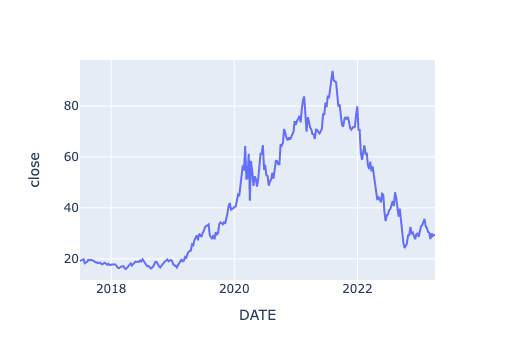

attempt:RFACR


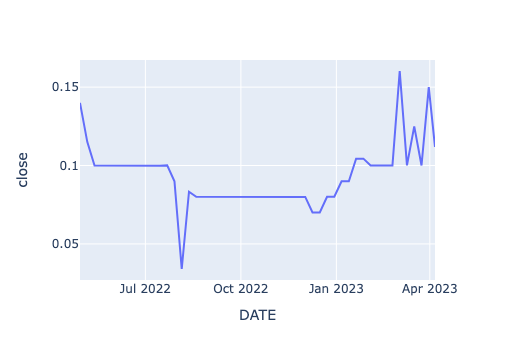

attempt:XELAP


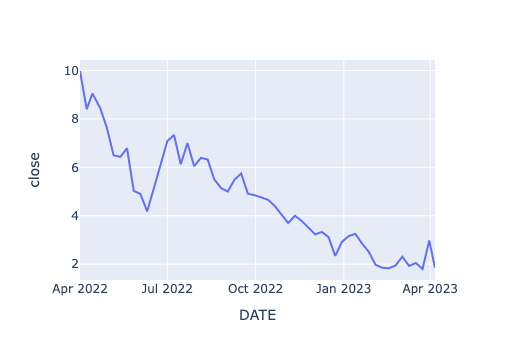

attempt:GBBKR


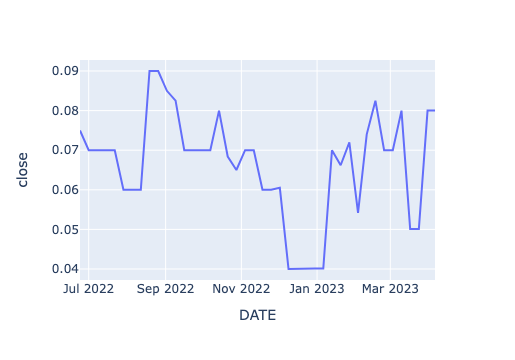

attempt:GLSTR


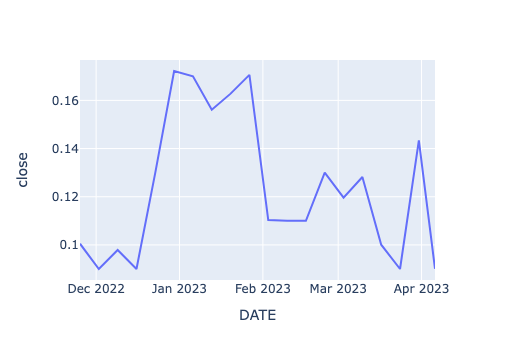

attempt:BUR


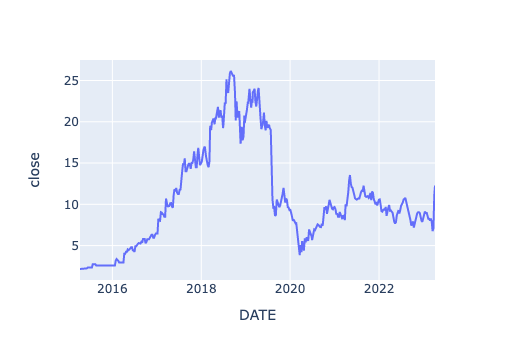

attempt:YMAB


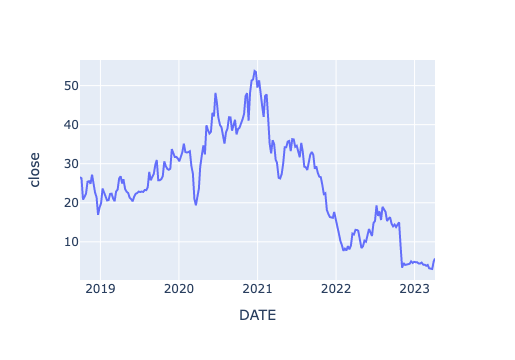

attempt:ZXZZT


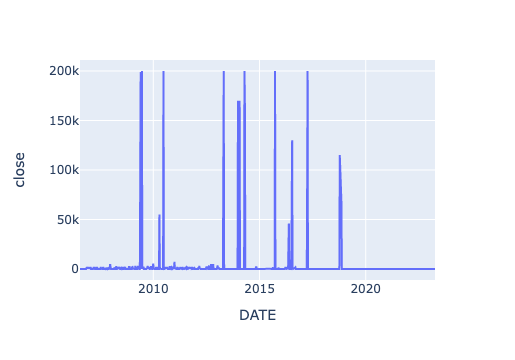

attempt:GFAI


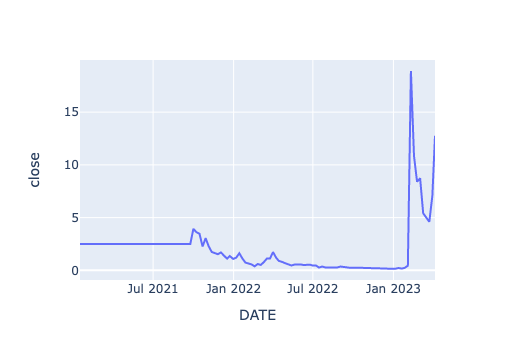

attempt:EAST


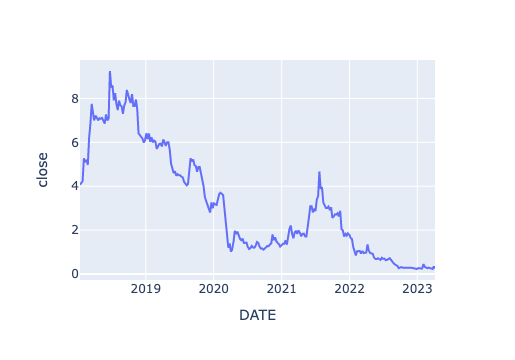

attempt:BNOX


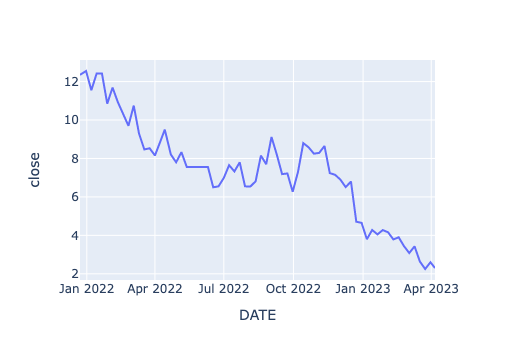

attempt:SOUN


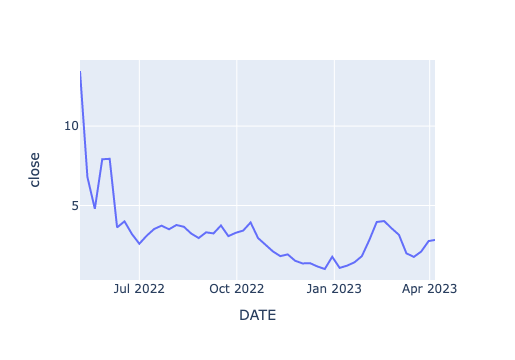

attempt:CALA


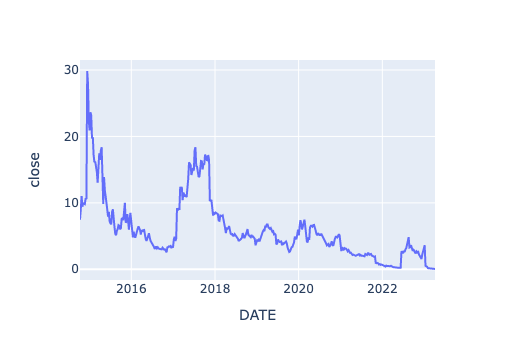

attempt:PLSE


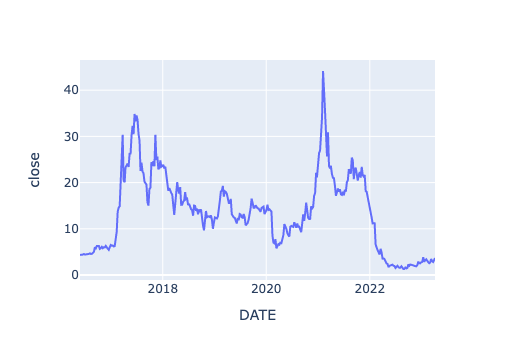

attempt:MCB


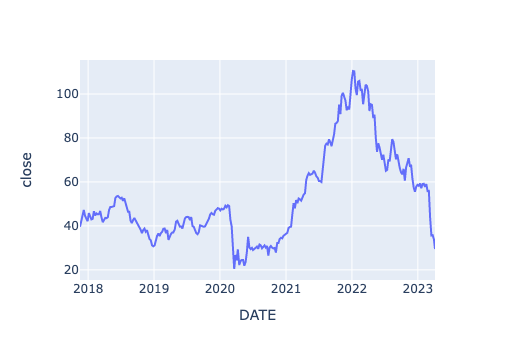

attempt:PALI


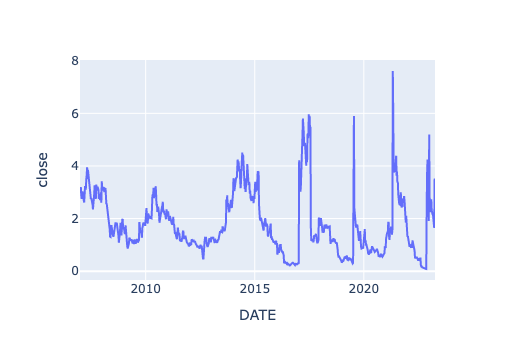

attempt:BCLI


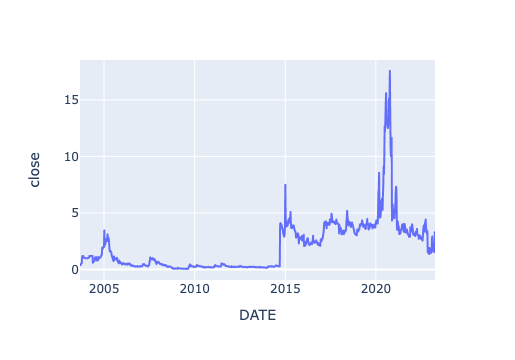

attempt:QBTS


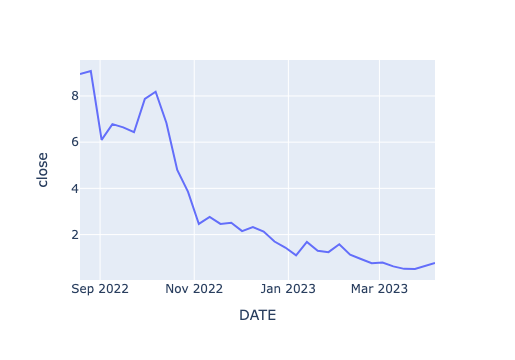

attempt:MARK


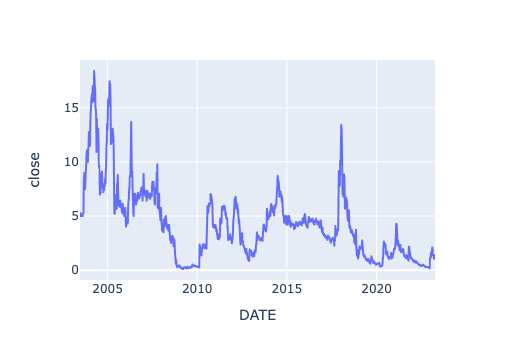

attempt:CRTD


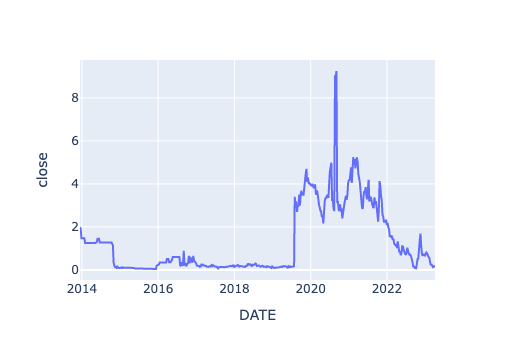

attempt:OCX


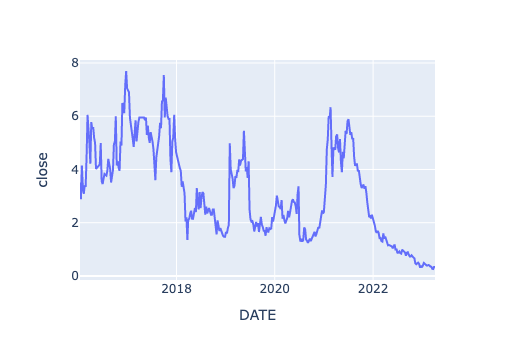

attempt:NVVE


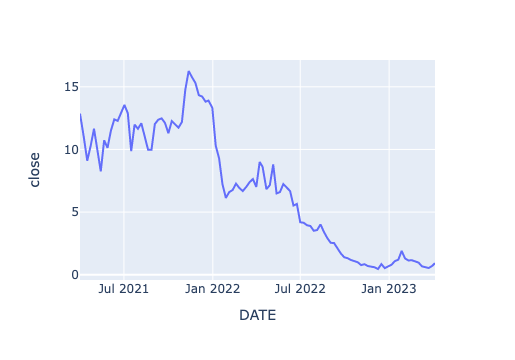

attempt:GRPN


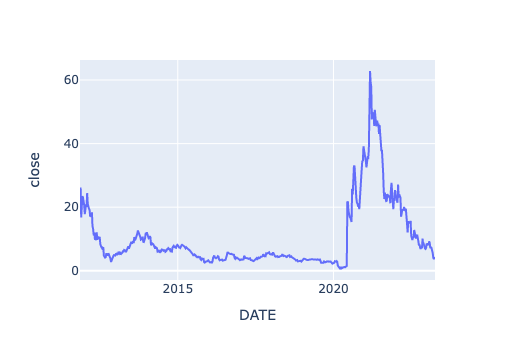

attempt:BBAI


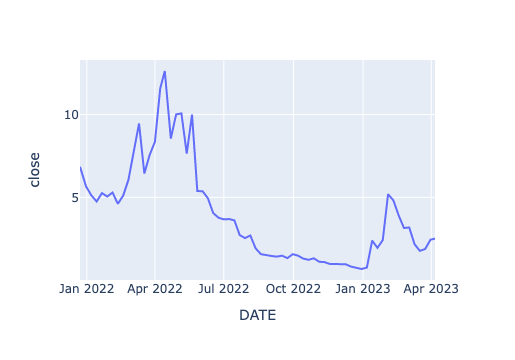

attempt:PRFX


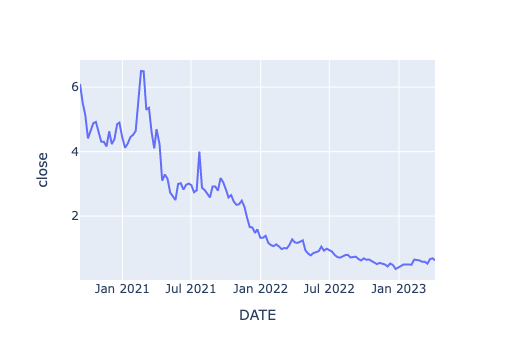

attempt:LOCL


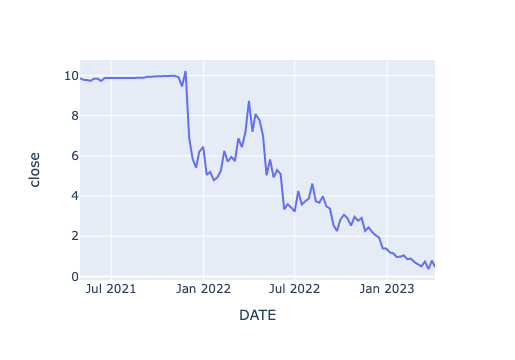

attempt:INZY


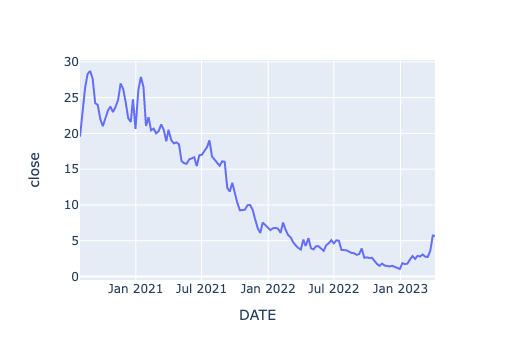

attempt:COE


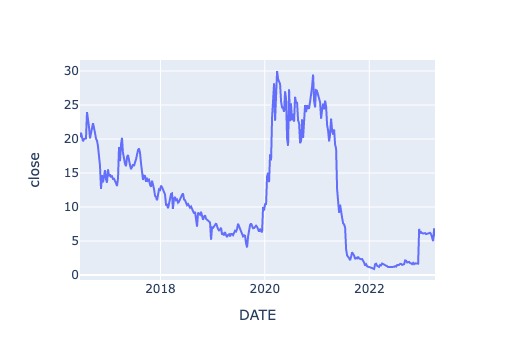

attempt:PPSI


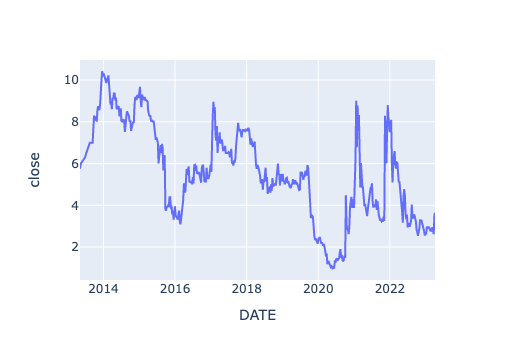

attempt:AI


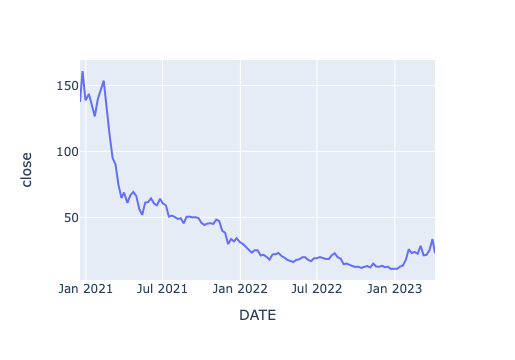

attempt:DGLY


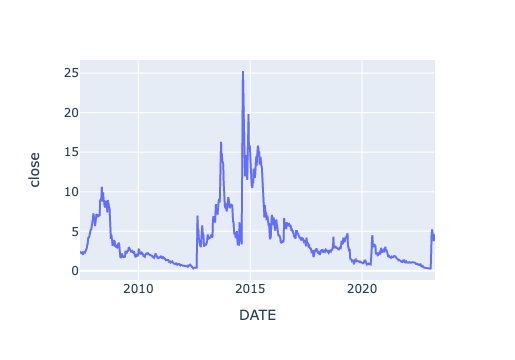

attempt:GSRMR


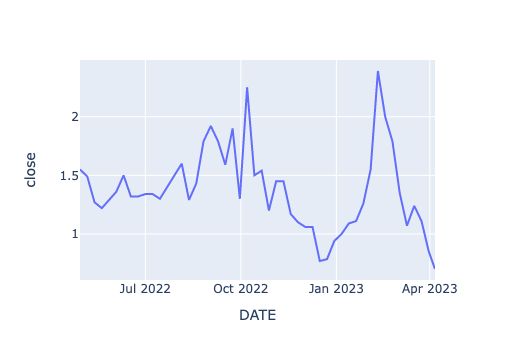

attempt:IONQ


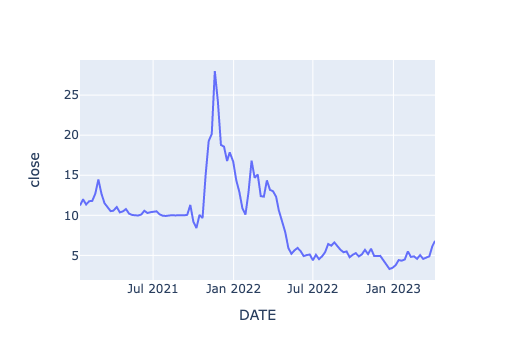

attempt:ACAXR


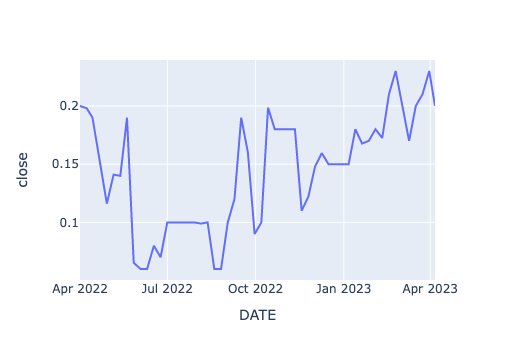

attempt:ATIF


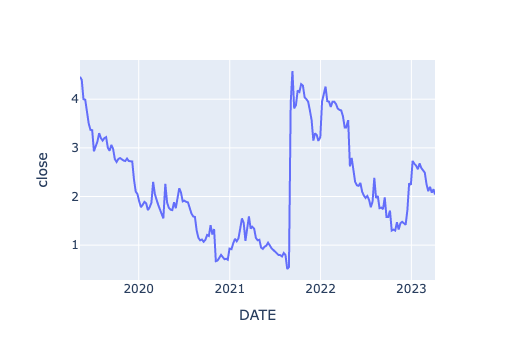

attempt:VRME


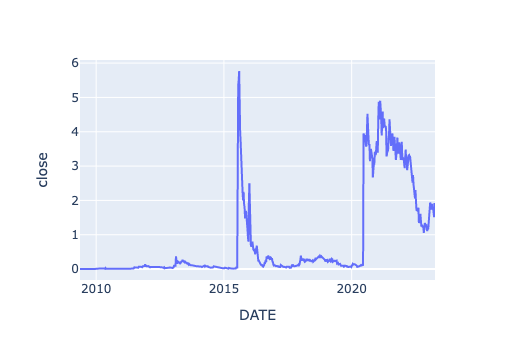

attempt:RGTI


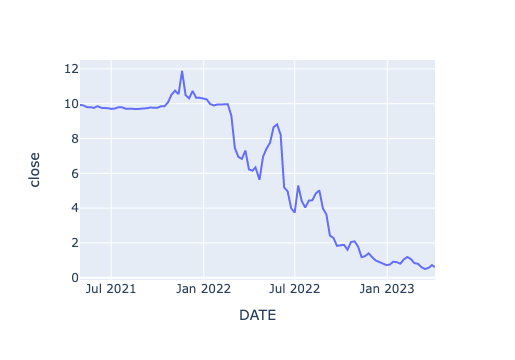

attempt:GWH


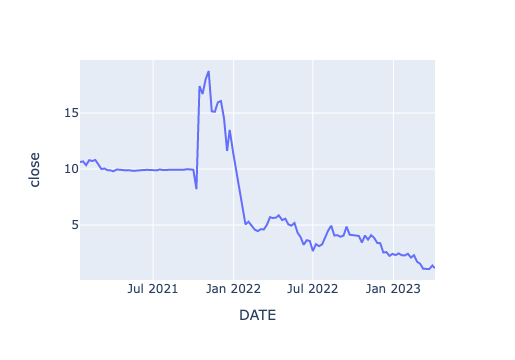

attempt:PRTK


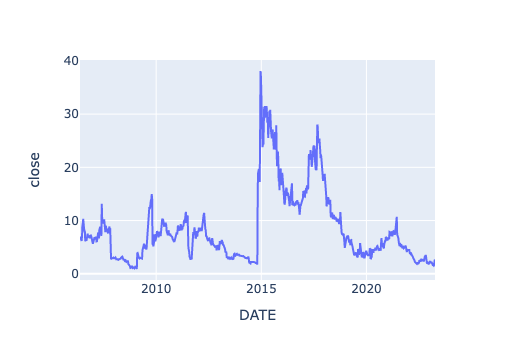

attempt:RAYA


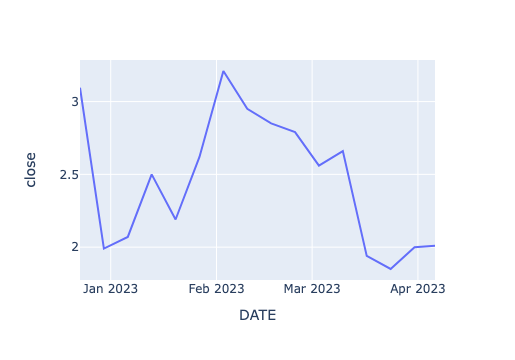

attempt:GDEV


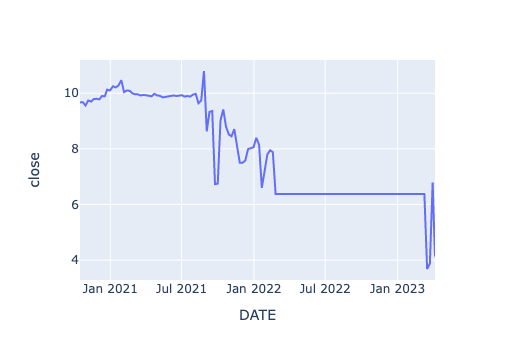

attempt:GTBP


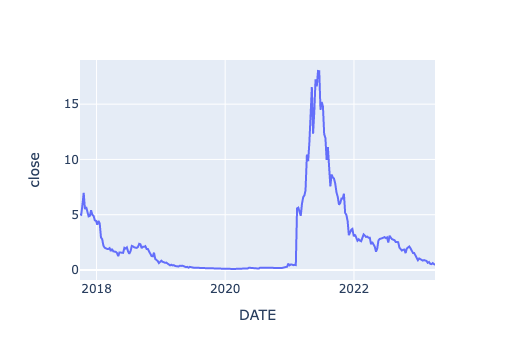

attempt:CRVS


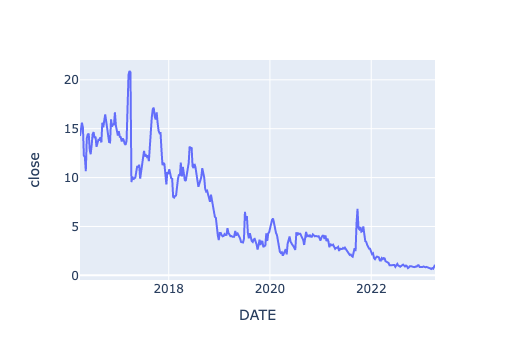

attempt:PACB


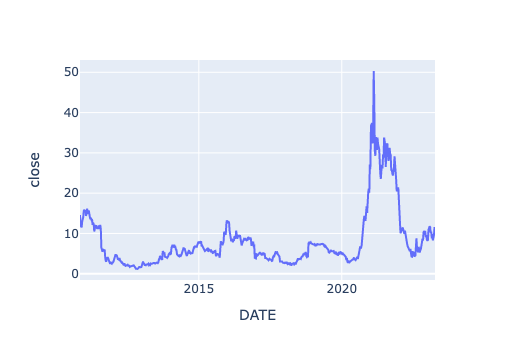

attempt:EFC-PB
attempt:WULF


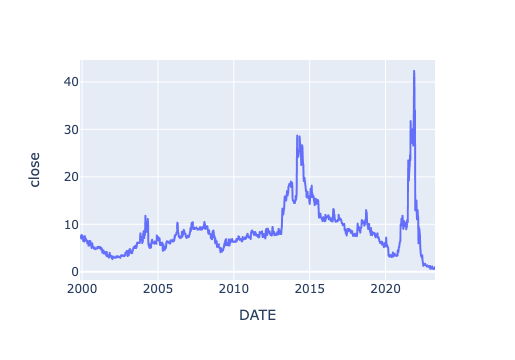

attempt:ALIM


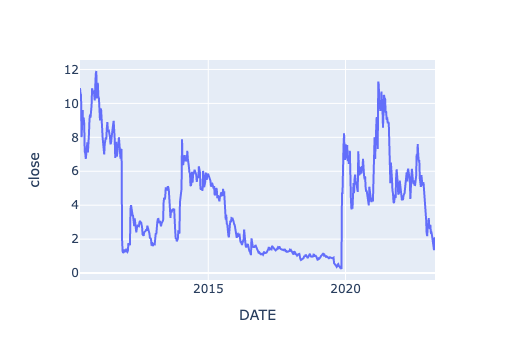

attempt:POAI


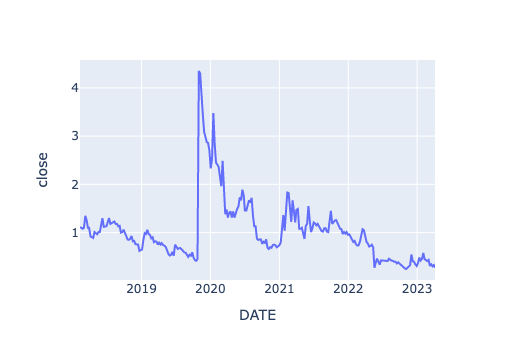

attempt:RAAS


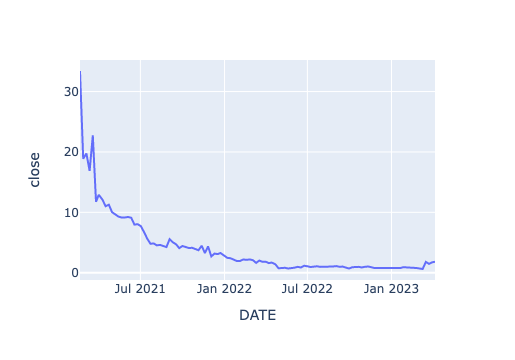

attempt:CCM


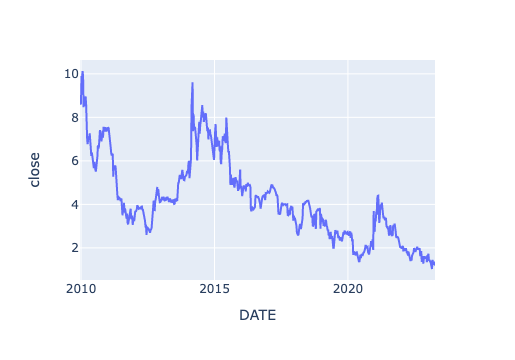

CRTD
OCX
NVVE
GRPN
BBAI
PRFX
LOCL
INZY
COE
PPSI
AI
DGLY
GSRMR
IONQ
ACAXR
ATIF
VRME
RGTI
GWH
PRTK
RAYA
GDEV
GTBP
CRVS
PACB
WULF
ALIM
POAI
RAAS
CCM
SAFE
RFACR
XELAP
GBBKR
GLSTR
BUR
YMAB
ZXZZT
GFAI
EAST
BNOX
SOUN
CALA
PLSE
MCB
PALI
BCLI
QBTS
MARK
CRTD
-0.00861739665407149
OCX
-0.05190108635379487
NVVE
-0.5355234113484799
GRPN
-0.12502734758898315
BBAI
-0.4438171469322665
PRFX
-0.12267698431099983
LOCL
-0.40651407652421806
INZY
-0.6896768800919704
COE
-0.3418406305048265
PPSI
-0.04998374083771839
AI
-2.842675576532624
DGLY
0.025037176901544722


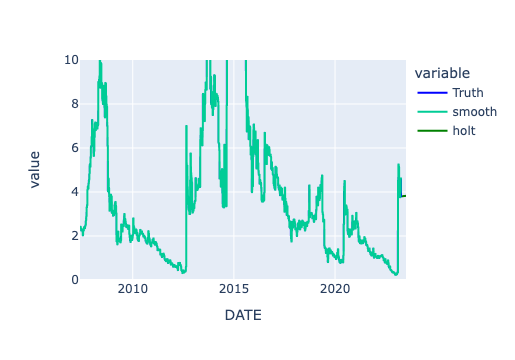

GSRMR
-0.13199581955574724
IONQ
-0.352092606414641
ACAXR
0.00021610900463808758


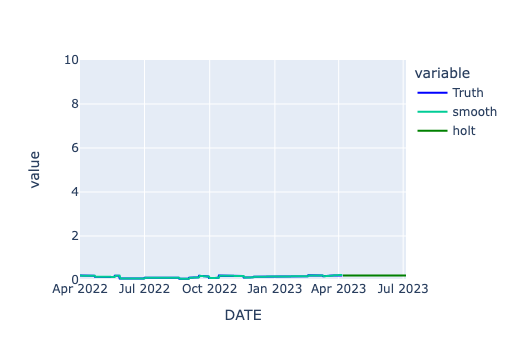

ATIF
-0.11027271129435579
VRME
0.27864008533355134


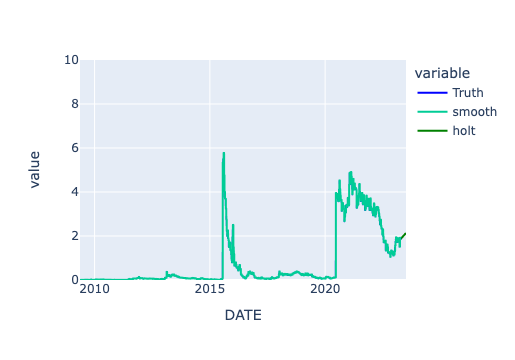

RGTI
-0.5693884041729785
GWH
-0.35561939943878995
PRTK
-0.03337581353347785
RAYA
-0.7414760070025914
GDEV
-0.45489294273832304
GTBP
-0.04707203200779697
CRVS
-0.11858666081976676
PACB
-0.061346426474811366
WULF
-0.02662998250346371
ALIM
-0.08070510474755954
POAI
-0.016880203797833504
RAAS
-0.3175363168828804
CCM
-0.05399613017753335
SAFE
0.5542773698583829


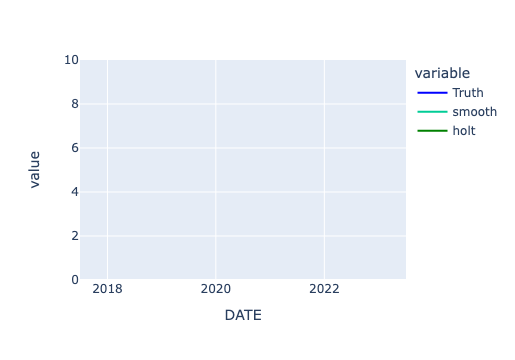

RFACR
-0.006796314471640405
XELAP
-0.8287456596717844
GBBKR
0.02309757503463919


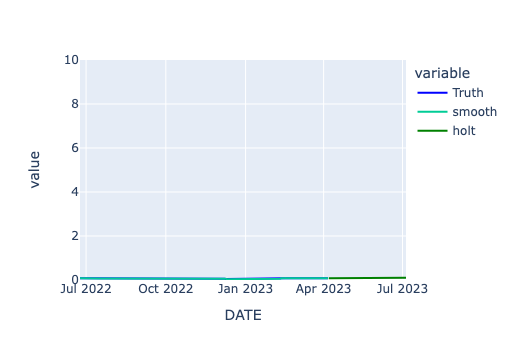

GLSTR
-0.005965948291740908
BUR
0.4945490218959723


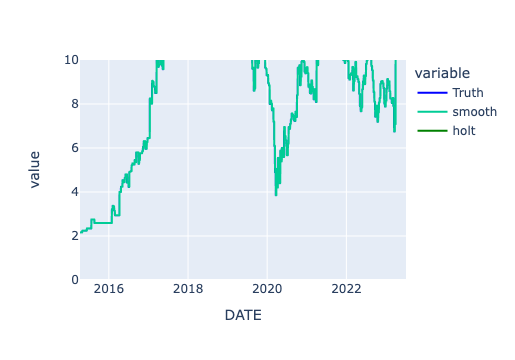

YMAB
-0.9097628317428574
ZXZZT
-0.037148683355686885
GFAI
2.3662250716339273


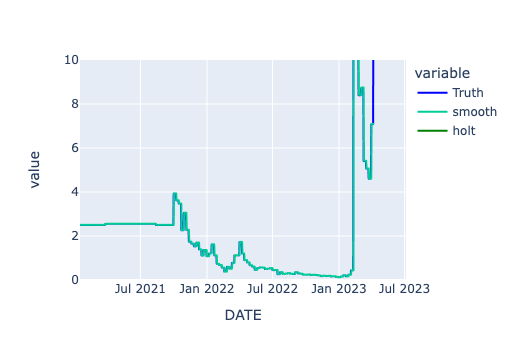

EAST
-0.046719038213668546
BNOX
-1.7361072460446665
SOUN
-0.8319656442820453
CALA
-0.018940161178515276
PLSE
-0.06744852441710059
MCB
-0.37138124355702473
PALI
-0.011292290665708027
BCLI
0.06482743247206013


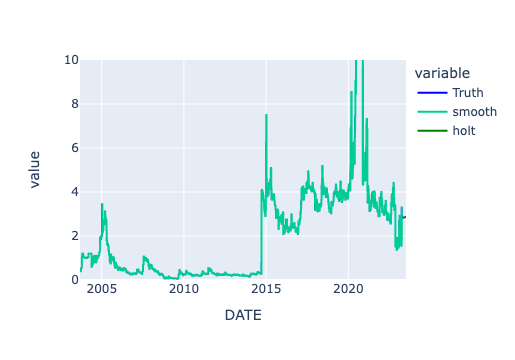

QBTS
-0.4380488458584719
MARK
-0.026982435412373773


In [258]:
##ORIGINAL SCRIPT, good for showing forecasts
f = {}
a = {}
s = {}

master_forecasts = {}

for t in ts:
    print(t)
    
    employment = ts[t]['close']
    employment.index = ts[t].DATE
    employment = employment.asfreq('D')

    smooth = ExponentialSmoothing(
        employment,
        trend="add",
        use_boxcox=True,
        initialization_method="estimated",
    ).fit()
    
#change to include predictions as s['symbol']['90 days'] 

    for pf in pred_freq:
        forecasts = smooth.forecast(pf)
    
    if pf == 90:
        s[t] = smooth
        a[t] = employment
        f[t] = forecasts
    
#loop through forecasts to see which ones are positive slope    
# date_1 = datetime.datetime.today()
# prediction_dates[date_1] = f[i].index[-1:][0]
predictions[f[i].index[-1:][0]] = []

for i in f:
    print(i)
    
    #print(f[i].index[-1:][0])
    #subtract the last value from the first moment to get slope
    chg = f[i][-1] - f[i][1]
    print(chg)
    if chg > 0:
        predictions[f[i].index[-1:][0]].append(i)
        
        smoothData = pd.DataFrame([a[i].values, s[i].fittedvalues.values]).T
        smoothData.columns = ['Truth','smooth']
        smoothData.index = a[i].index

        fig = px.line(smoothData, y = ['Truth','smooth'], 
                x = smoothData.index,
                color_discrete_map={"Truth": 'blue',
                                    "holt":'red',
                                  }
               )
        idx_len = len(smoothData.index)*-1
        fig.update_xaxes(range=[smoothData.index[idx_len], f[i].index[-1]])
        fig.update_yaxes(range=[0, f[i][-1]+(.1*f[i][-1])])

        # Incorporating the Forecasts
        fig.add_trace(go.Scatter(x=f[i].index, y = f[i].values, name='holt', line = {'color':'green'}))
        #fig.add_trace(go.Scatter(x=forecast020.index, y = forecast020.values, name='Forecast alpha=0.2', line={'color':'red'}))
        #fig.add_trace(go.Scatter(x=forecast050.index, y = forecast050.values, name='Forecast alpha=0.5', line={'color':'green'}))
        #fig.add_trace(go.Scatter(x=forecast080.index, y = forecast080.values, name='Forecast alpha=0.8', line={'color':'purple'}))

        #fig.write_html('figure.html')
        fig.show()

In [259]:
predictions

{Timestamp('2023-07-05 00:00:00', freq='D'): ['DGLY',
  'ACAXR',
  'VRME',
  'SAFE',
  'GBBKR',
  'BUR',
  'GFAI',
  'BCLI']}

In [34]:
from ratelimit import limits, sleep_and_retry


TIME_PERIOD = 60
@sleep_and_retry
@limits(calls=60, period=TIME_PERIOD)
def get_ally_quote1(opt):
     
    consumer_key = 'q6CzdLDgJs03oaKDX5rnxY59uqCbvhvEpzI5qvXxpms3'
    consumer_secret="fGevm2mp7XcnPWmLgYyAXnaNX8SA0QtjJ6m5ExykhjU8"
    oauth_token="ViQOJDt8BFyt0iQiCAL9zn1cljYHTX18pvCCP2gi1to0"
    oauth_token_secret="MEQSJZ9v0IGqU5DWqEYdum0qcjucocWd8Eix0kNWvGc3"

    test = OAuth1Session(consumer_key,
              client_secret=consumer_secret,
              resource_owner_key=oauth_token,
              resource_owner_secret=oauth_token_secret)
    url = 'https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols='+opt
    print(url)
    r = test.get(url)
    print(r)
    data = r.json()
    
    return data

def compare_todays_predictions():

    cur_pred = pd.read_csv('preds.csv')

    #play with preds
    cur_pred.columns = cur_pred.columns.str.replace('Unnamed: 0','symbol')

    t = cur_pred.sort_values(['symbol'])

    for s in t['symbol'].unique():
        ## get prices
        da = get_ally_quote1(s)
        print(s)
        #get all predictions
        rows = cur_pred[cur_pred['symbol']==s]
        ## then iterate predictions to see
        pred_dte = rows['pred_dte']
        for idxx, row in rows.iterrows():
            rd = cur_pred.iloc[[idxx]]
            #drop days with no predictions
            rd = rd.dropna(axis=1)
            #rotate data to have days by rows
            rd = rd.T
            #remove the prediction date
            rd.drop(['pred_dte'],inplace=True)

            #if we are to the prediction day
            today = datetime.datetime.today()
            #print('Today is:'+ today.strftime("%Y-%m-%d"))
            for l, dte in rd.iterrows():
                if l != 'symbol':
                    prd_dte = pd.to_datetime(l) 
                    enddte = prd_dte + datetime.timedelta(days=1)
                    stdte = prd_dte + datetime.timedelta(days=-1)
                    preddte = today
                    #print(l)
                    if ((stdte <= preddte) and (enddte >= preddte)):
                        print('On '+pred_dte+' we made a prediction: comparing if '+today.strftime("%Y-%m-%d")+' is between '+stdte.strftime("%Y-%m-%d")+' and '+enddte.strftime("%Y-%m-%d"))

                        #check the price!
                        print('getting the price...')

                        print('comparing '+ str(dte[dte.keys()[0]])+' to last:'+da['response']['quotes']['quote']['last'])

                        #print(da['response']['quotes']['quote']['last'])
                        #print(da['response']['quotes']['quote']['chg'])


            #if today > any date in columns?
    #dte.head(20)
    #loop through forecasts to see which ones are positive slope    
    # date_1 = datetime.datetime.today()
    # prediction_dates[date_1] = f[i].index[-1:][0]
#load previous preds
cur_pred = pd.read_csv('preds.csv')

#play with preds
cur_pred.columns = cur_pred.columns.str.replace('Unnamed: 0','symbol')

t = cur_pred.sort_values(['symbol'])


compare_todays_predictions()

NameError: name 'OAuth1Session' is not defined

In [783]:
cur_pred = pd.read_csv('preds.csv')

#play with preds
cur_pred.columns = cur_pred.columns.str.replace('Unnamed: 0','symbol')

t = cur_pred.sort_values(['symbol'])

for s in t['symbol'].unique():
    ## get prices
    #da = get_ally_quote1(s)
    print(s)
    #get all predictions
    rows = cur_pred[cur_pred['symbol']==s]
    ## then iterate predictions to see
    pred_dte = rows['pred_dte']
    for idxx, row in rows.iterrows():
        #print(row)
        rd = cur_pred.iloc[[idxx]]
        #drop days with no predictions
        rd = rd.dropna(axis=1)
        #rotate data to have days by rows
        rd = rd.T
        #remove the prediction date
        rd.drop(['pred_dte'],inplace=True)
    print(rd.head())

ABCM
                            53
symbol                    ABCM
2023-04-25 00:00:00  15.631851
2023-04-30 00:00:00  15.648086
2023-05-05 00:00:00  15.664336
2023-05-15 00:00:00  15.696879
ACAXR
                          126
symbol                  ACAXR
2023-04-28 00:00:00  0.200177
2023-05-08 00:00:00  0.200202
2023-04-23 00:00:00  0.200165
2023-04-18 00:00:00  0.200152
AMST
                           59
symbol                   AMST
2023-04-29 00:00:00  4.780322
2023-05-04 00:00:00  4.780429
2023-04-24 00:00:00  4.780214
2023-05-14 00:00:00  4.780644
ANVS
                            84
symbol                    ANVS
2023-04-27 00:00:00  15.018589
2023-05-02 00:00:00  15.088898
2023-04-22 00:00:00  14.948671
2023-05-12 00:00:00    15.2307
APCX
                          100
symbol                   APCX
2023-04-26 00:00:00   1.88277
2023-05-01 00:00:00  1.890416
2023-04-21 00:00:00  1.875151
2023-05-11 00:00:00  1.905782
APLD
                          120
symbol                   AP

In [734]:
#for each unique symbol, check the price, get all predicitons, then iterate predictions to see if we are to the prediction day,  and compare prediction to today.
#for each unique symbol
for s in t['symbol'].unique():
        
    if s == 'IPA':
        #get prices
        da = get_ally_quote1(s)
        print(s)
        #get all predictions
        rows = cur_pred[cur_pred['symbol']==s]
        #then iterate predictions to see
        for idxx, row in rows.iterrows():
            rd = cur_pred.iloc[[idxx]]
            rd = rd.dropna(axis=1)
            rd = rd.T
            rd.drop(['pred_dte'],inplace=True)

            #if we are to the prediction day
            today = datetime.datetime.today()
            print('Today is:'+ today.strftime("%Y-%m-%d"))
            for l, dte in rd.iterrows():
                if l != 'symbol':
                    prd_dte = pd.to_datetime(l) 
                    enddte = prd_dte + datetime.timedelta(days=1)
                    stdte = prd_dte + datetime.timedelta(days=-1)
                    preddte = pd.to_datetime(l)
                    print('comparing if '+today.strftime("%Y-%m-%d")+' is between '+stdte.strftime("%Y-%m-%d")+' and '+enddte.strftime("%Y-%m-%d"))
                    
                    #if (stdte < preddte) & (enddte < preddte):
                    
                    #check the price!
                    print('getting the price...')
                    #print(da['response']['quotes']['quote']['ask'])
                    #print(da['response']['quotes']['quote']['bid'])
                    print('comparing '+ str(dte[dte.keys()[0]])+' to last:'+da['response']['quotes']['quote']['last'])

                    #print(da['response']['quotes']['quote']['last'])
                    #print(da['response']['quotes']['quote']['chg'])

        pred_dte = rows['pred_dte']
        #if today > any date in columns?
#dte.head(20)

https://devapi.invest.ally.com/v1/market/ext/quotes.json?symbols=IPA
<Response [200]>
IPA
Today is:2023-04-14
comparing if 2023-04-14 is between 2023-04-19 and 2023-04-21
getting the price...
comparing 2.881049397334326 to last:2.5300
comparing if 2023-04-14 is between 2023-04-24 and 2023-04-26
getting the price...
comparing 2.8916516620710664 to last:2.5300
comparing if 2023-04-14 is between 2023-04-29 and 2023-05-01
getting the price...
comparing 2.902306061187453 to last:2.5300
comparing if 2023-04-14 is between 2023-05-09 and 2023-05-11
getting the price...
comparing 2.9237725490313013 to last:2.5300
comparing if 2023-04-14 is between 2023-06-08 and 2023-06-10
getting the price...
comparing 2.9894571188339536 to last:2.5300
comparing if 2023-04-14 is between 2023-07-08 and 2023-07-10
getting the price...
comparing 3.057125947704056 to last:2.5300
Today is:2023-04-14
comparing if 2023-04-14 is between 2023-04-23 and 2023-04-25
getting the price...
comparing 2.8916516643727315 to las

In [749]:
print(s['response']['quotes']['quote'])
print(s['response']['quotes']['quote']['bid'])

{'adp_100': '151.4162', 'adp_200': '146.7440', 'adp_50': '157.6348', 'adv_21': '51720526', 'adv_30': '55826420', 'adv_90': '64294058', 'ask': '165.5900', 'ask_time': '07:14', 'asksz': '1', 'basis': 'na', 'beta': '0.8130', 'bid': '165.5000', 'bid_time': '07:14', 'bidsz': '1', 'bidtick': 'u', 'chg': '0.0000', 'chg_sign': 'e', 'chg_t': 'na', 'cl': '166.4700', 'contract_size': 'na', 'cusip': 'na', 'date': '2023-04-18', 'datetime': '2023-04-18T00:00:00-04:00', 'days_to_expiration': 'na', 'div': '0.23', 'divexdate': '20230210', 'divfreq': 'Q', 'divpaydt': '20230216', 'dollar_value': '19618199.56', 'eps': '5.89', 'exch': 'NASD', 'exch_desc': 'NASDAQ', 'hi': '0.0000', 'iad': '0.92', 'idelta': 'na', 'igamma': 'na', 'imp_volatility': 'na', 'incr_vl': '5374682', 'irho': 'na', 'issue_desc': 'na', 'itheta': 'na', 'ivega': 'na', 'last': '166.4700', 'lo': '0.0000', 'name': 'APPLE INC.', 'op_delivery': 'na', 'op_flag': '1', 'op_style': 'na', 'op_subclass': 'na', 'openinterest': 'na', 'opn': '0.0000', 

IPA
IPA
0.1989023780453194


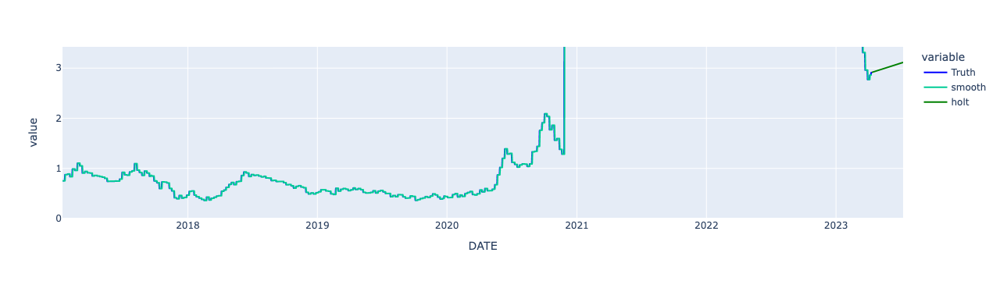

AttributeError: 'NoneType' object has no attribute 'show'

In [732]:
create_preds(ts1,fg=True)

attempt:IPA


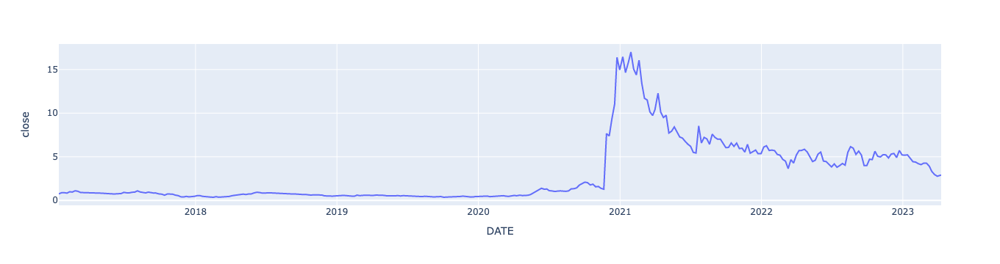

In [719]:
ts1 = get_time_series(['IPA'],fg=True)

In [515]:
rd.head()

,0
symbol,GFAI
2023-04-19 00:00:00,12.998053
2023-04-24 00:00:00,13.124335
2023-04-29 00:00:00,13.251786
2023-05-09 00:00:00,13.510232


In [414]:
print(da['response']['quotes']['quote']['last'])


9.2000


In [454]:
cur_pred.iloc[[0]]

,symbol,2023-04-19 00:00:00,2023-04-24 00:00:00,2023-04-29 00:00:00,2023-05-09 00:00:00,2023-06-08 00:00:00,2023-07-08 00:00:00,pred_dte,2023-04-18 00:00:00,2023-04-23 00:00:00,2023-04-28 00:00:00,2023-05-08 00:00:00,2023-06-07 00:00:00,2023-07-07 00:00:00
0,GFAI,12.998053,13.124335,13.251786,13.510232,14.314685,15.16463,2023-04-09,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#https://github.com/ranaroussi/yfinance


In [ ]:
#https://www.ally.com/api/invest/documentation/market-toplists-get/